**Date**: 2024-08-28

**Author**: Huaying Qiu, Wenrui Wu

# Preparation

In [1]:
import tifffile 
import numpy as np
import pandas as pd
from pathlib import Path
import os 
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import tensorflow as tf
from deepcell.applications import Mesmer
from deepcell.utils.plot_utils import create_rgb_image, make_outline_overlay
from src.segment_mesmer import segment_mesmer, img_scale_marker
from src.load_config import get_path_file
from src.crop_tma import load_marker_list

os.environ["CUDA_VISIBLE_DEVICES"]="0" # specify visible gpu(s) 0-3
try:
    tf_gpus = tf.config.list_physical_devices('GPU')
    for gpu in tf_gpus:
        tf.config.experimental.set_memory_growth(gpu, True) # allow memory growth on visible gpu(s)
except:
    pass 

In [2]:
def contour_segmentation(overlay):
    # create RGBA image
    _, height, width, _ = overlay.shape
    im_segmentation = np.zeros((height, width, 4), dtype=np.uint8)  # RGBA image
    im_segmentation[..., [0,1,2]] = 255 # RGB
    im_segmentation[..., 3] = (overlay[0, ..., 0] * 255).astype(np.uint8) # Alpha: transparant when overlay == 0
    return im_segmentation

def format_list_with_double_quotes(lst):
    return '[' + ', '.join(f'"{item}"' for item in lst) + ']'

In [3]:
# select parameter ^ #####
path_folder = "/mnt/nfs/home/wenruiwu/projects/Sarcoma/data_test/data_input/20240611_LMS-TMA_Scan1"
# select parameter $ #####

path_dict = get_path_file(path_folder)
path_dict

{'name': '20240611_LMS-TMA_Scan1',
 'path_qptiff': '/mnt/nfs/home/wenruiwu/projects/Sarcoma/data_test/data_input/20240611_LMS-TMA_Scan1/20240611_LMS-TMA_Scan1.qptiff',
 'path_marker': '/mnt/nfs/home/wenruiwu/projects/Sarcoma/data_test/data_input/20240611_LMS-TMA_Scan1/20240611_LMS-TMA_Scan1_MarkerList.txt',
 'path_metadata': '/mnt/nfs/home/wenruiwu/projects/Sarcoma/data_test/data_input/20240611_LMS-TMA_Scan1/20240611_LMS-TMA_Scan1_metadata.txt',
 'path_dearrayer': '/mnt/nfs/home/wenruiwu/projects/Sarcoma/data_test/data_input/20240611_LMS-TMA_Scan1/20240611_LMS-TMA_Scan1_dearrayer.txt'}

# Data Exploration

In [4]:
im_tma = tifffile.imread(path_dict["path_qptiff"])

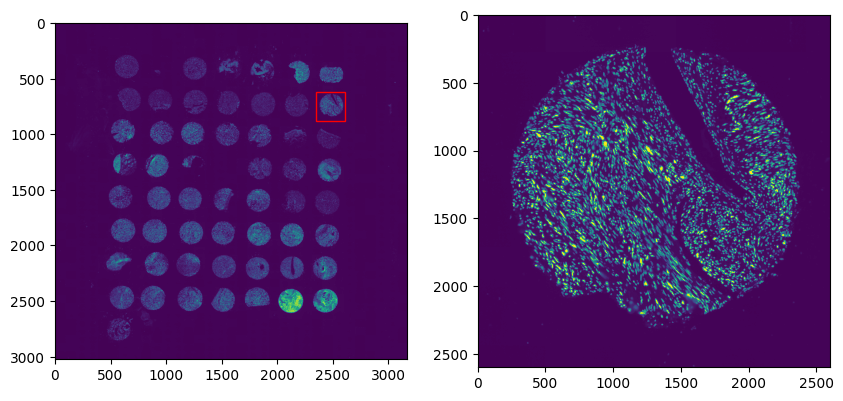

In [5]:
# location of one core ^ #####
y_beg, y_end = 6200, 8800
x_beg, x_end = 23500, 26100
# location of one core $ #####

im_core = im_tma[:, y_beg:y_end, x_beg:x_end]
pixel_step = 10
fig = plt.figure(figsize=(10, 10))
# figure 1
ax = fig.add_subplot(1, 2, 1)
ax.imshow(im_tma[0, ::pixel_step, ::pixel_step])
rect = patches.Rectangle((x_beg/pixel_step, y_beg/pixel_step), 
                         x_end/pixel_step - x_beg/pixel_step, 
                         y_end/pixel_step - y_beg/pixel_step,
                         linewidth=1, edgecolor='red', facecolor='none')
ax.add_patch(rect)
# figure 2
ax = fig.add_subplot(1, 2, 2)
ax.imshow(im_core[0])
plt.show()

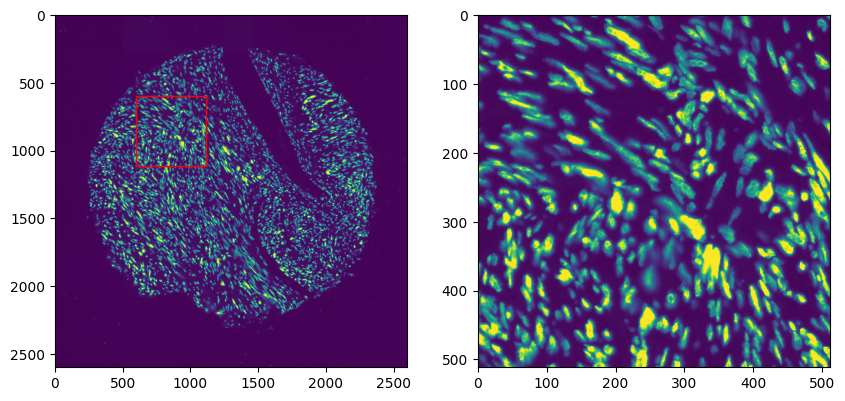

In [6]:
# location of small region within one core ^ #####
x_sub_beg, x_sub_end = 600, 600 + 512
y_sub_beg, y_sub_end = 600, 600 + 512
# location of small region within one core $ #####

im_core_sm = im_core[:, y_sub_beg:y_sub_end, x_sub_beg:x_sub_end]
fig = plt.figure(figsize=(10, 10))
# figure 1
ax = fig.add_subplot(1, 2, 1)
ax.imshow(im_core[0])
rect = patches.Rectangle((x_sub_beg, y_sub_beg), 
                         x_sub_end - x_sub_beg, 
                         y_sub_end - y_sub_beg,
                         linewidth=1, edgecolor='red', facecolor='none')
ax.add_patch(rect)
# figure 2
ax = fig.add_subplot(1, 2, 2)
ax.imshow(im_core_sm[0])
plt.show()

# Segmentation

## Get nuclear and membrane channel

In [7]:
marker_list = load_marker_list(path_dict["path_marker"])
    
# Select the markers listed below (some of names of markers might be changed)
chunk_size = 10
pd.DataFrame([marker_list[i:i + chunk_size] for i in range(0, len(marker_list), chunk_size)]).fillna("")

,0,1,2,3,4,5,6,7,8,9
0,DAPI,EGFR,CD56,CD16,CD20,CD69,ATP5A,CD57,CD68,Tim-3
1,MPO,CD11c,HLA1,CD3,CD45RA,CD47,CD11b,CS,CD138 (syndecan-1),GLUT1
2,H3K27ac,TCF1_7,α-SMA,FoxP3,Podoplanin,Rb,Desmin,GranzymeB,PTEN,IDO
3,Collagen-IV,Tox_Tox2,CD15,PD-1,CD134,NaKATP,Histone-H3,β-catenin,Vimentin,CD8
4,panCK,LAG-3,CD39,CD4,PD-L1-50,CD31,Tbet,HLA1-50,CD206,HLA-DR
5,Vimentin-50,CD45,PD-L1-100,CD163,HLA1-100,C1Q,Vimentin-100,VDAC1,PD-L1-300,CD45RO
6,HLA1-300,Ki67,Vimentin-300,PDL1,CD3,,,,,


## Test: Scaled signals

In [8]:
# select marker ^ #####
boundary_1 = ['GLUT1', 'NaKATP', 'β-catenin', 'CD45', 'HLA1-300']
boundary_2 = ['CD68', 'CD11c', 'Podoplanin', 'CD15', 'CD8', 'panCK', 'CD31', 'CD206', 'CD163']

internal_1 = ['DAPI']
internal_2 = ['α-SMA', 'Desmin', 'Vimentin']

boundary = boundary_1 + boundary_2
internal = internal_1 + internal_2
# select marker $ #####

# set parameter ^ #####
scale = True
pixel_size_um = 0.5068
maxima_threshold = 0.075
interior_threshold = 0.20
# set parameter $ #####

im = im_core_sm
print(im.shape)
marker_dict = {}
for i, marker in enumerate(marker_list):
    marker_dict[marker] = im[i]
predictions, rgb_image, overlay = segment_mesmer(
    boundary, internal, marker_dict, 
    scale, pixel_size_um, maxima_threshold, interior_threshold
)

(65, 512, 512)


2024-09-14 03:32:10.782209: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-14 03:32:11.191113: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22348 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:31:00.0, compute capability: 8.6


2024-09-14 03:32:19.788540: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8100
2024-09-14 03:32:20.377300: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


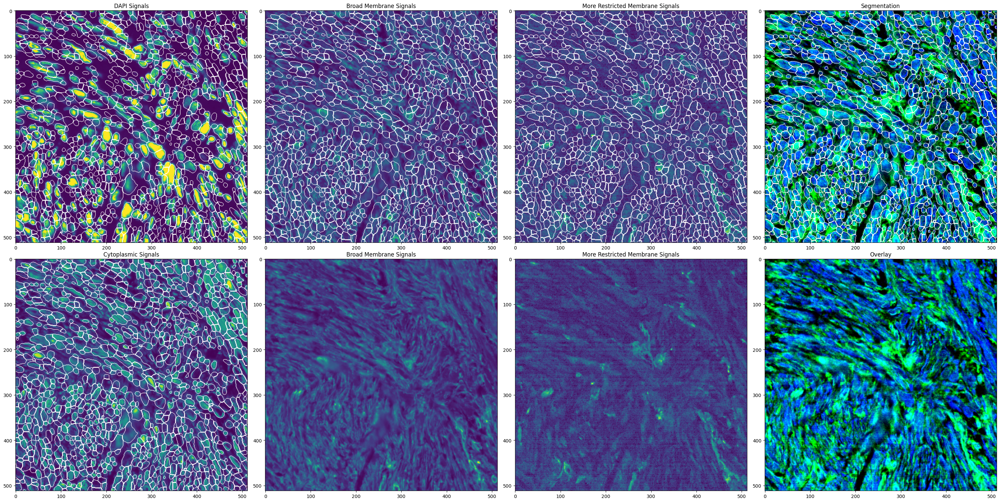

{
    "boundary": ["GLUT1", "NaKATP", "β-catenin", "CD45", "HLA1-300", "CD68", "CD11c", "Podoplanin", "CD15", "CD8", "panCK", "CD31", "CD206", "CD163"],
    "internal": ["DAPI", "α-SMA", "Desmin", "Vimentin"],
    "scale": true,
    "pixel_size_um": 0.5068,
    "maxima_threshold": 0.075,
    "interior_threshold": 0.2
}


In [9]:
im_segmentation = contour_segmentation(overlay)

fig = plt.figure(figsize = (30,15))
# internal markers
ax = fig.add_subplot(2,4,1)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in internal_1], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('DAPI Signals')
ax = fig.add_subplot(2,4,5)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in internal_2], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('Cytoplasmic Signals')
# broad membrane markers
ax = fig.add_subplot(2,4,2)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_1], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('Broad Membrane Signals')
ax = fig.add_subplot(2,4,6)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_1], axis=0))
ax.title.set_text('Broad Membrane Signals')
# more restricted membrane markers
ax = fig.add_subplot(2,4,3)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_2], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('More Restricted Membrane Signals')
ax = fig.add_subplot(2,4,7)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_2], axis=0))
ax.title.set_text('More Restricted Membrane Signals')
# Mesmer
ax = fig.add_subplot(2,4,4)
ax.imshow(overlay[0, ...], cmap = 'gray')
ax.title.set_text('Segmentation')
ax = fig.add_subplot(2,4,8)
ax.imshow(rgb_image[0, ...], cmap = 'gray')
ax.title.set_text('Overlay')

plt.tight_layout()
plt.show()


# to help you fill the json file
print("{")
print(f'    "boundary": {format_list_with_double_quotes(boundary)},')
print(f'    "internal": {format_list_with_double_quotes(internal)},')
print(f'    "scale": {"true" if scale else "false"},')
print(f'    "pixel_size_um": {pixel_size_um},')
print(f'    "maxima_threshold": {maxima_threshold},')
print(f'    "interior_threshold": {interior_threshold}')
print("}")

## Test: Non-Scaled signals

In [10]:
# select marker ^ #####
boundary_1 = ['GLUT1', 'NaKATP', 'β-catenin', 'CD45', 'HLA1-300']
boundary_2 = ['CD68', 'CD11c', 'Podoplanin', 'CD15', 'CD8', 'panCK', 'CD31', 'CD206', 'CD163']

internal_1 = ['DAPI']
internal_2 = ['α-SMA', 'Desmin', 'Vimentin']

boundary = boundary_1 + boundary_2
internal = internal_1 + internal_2
# select marker $ #####

# set parameter ^ #####
scale = False
pixel_size_um = 0.5068
maxima_threshold = 0.075
interior_threshold = 0.20
# set parameter $ #####

im = im_core_sm
print(im.shape)
marker_dict = {}
for i, marker in enumerate(marker_list):
    marker_dict[marker] = im[i]
predictions, rgb_image, overlay = segment_mesmer(
    boundary, internal, marker_dict, 
    scale, pixel_size_um, maxima_threshold, interior_threshold
)

(65, 512, 512)


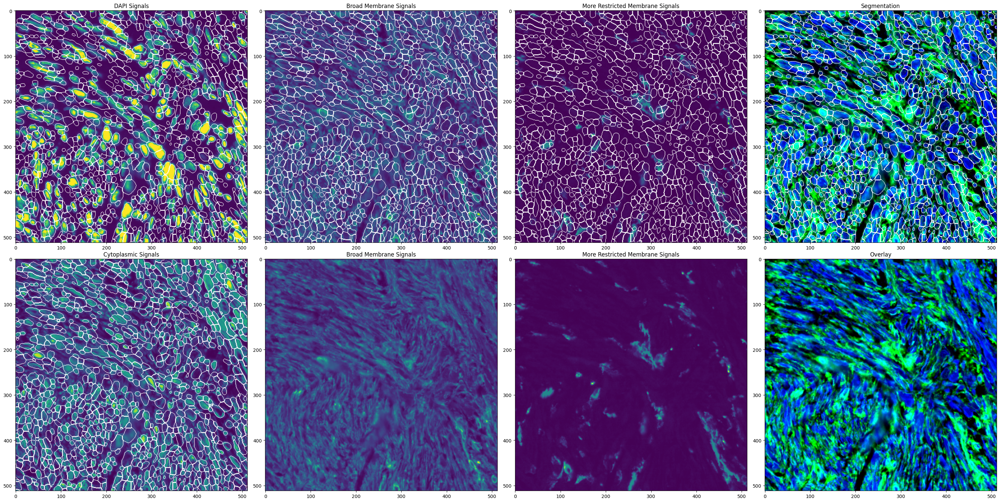

{
    "boundary": ["GLUT1", "NaKATP", "β-catenin", "CD45", "HLA1-300", "CD68", "CD11c", "Podoplanin", "CD15", "CD8", "panCK", "CD31", "CD206", "CD163"],
    "internal": ["DAPI", "α-SMA", "Desmin", "Vimentin"],
    "scale": false,
    "pixel_size_um": 0.5068,
    "maxima_threshold": 0.075,
    "interior_threshold": 0.2
}


In [11]:
im_segmentation = contour_segmentation(overlay)

fig = plt.figure(figsize = (30,15))
# internal markers
ax = fig.add_subplot(2,4,1)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in internal_1], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('DAPI Signals')
ax = fig.add_subplot(2,4,5)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in internal_2], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('Cytoplasmic Signals')
# broad membrane markers
ax = fig.add_subplot(2,4,2)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_1], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('Broad Membrane Signals')
ax = fig.add_subplot(2,4,6)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_1], axis=0))
ax.title.set_text('Broad Membrane Signals')
# more restricted membrane markers
ax = fig.add_subplot(2,4,3)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_2], axis=0))
ax.imshow(im_segmentation, cmap = 'gray')
ax.title.set_text('More Restricted Membrane Signals')
ax = fig.add_subplot(2,4,7)
ax.imshow(np.sum([img_scale_marker(marker, marker_dict, scale) for marker in boundary_2], axis=0))
ax.title.set_text('More Restricted Membrane Signals')
# Mesmer
ax = fig.add_subplot(2,4,4)
ax.imshow(overlay[0, ...], cmap = 'gray')
ax.title.set_text('Segmentation')
ax = fig.add_subplot(2,4,8)
ax.imshow(rgb_image[0, ...], cmap = 'gray')
ax.title.set_text('Overlay')

plt.tight_layout()
plt.show()


# to help you fill the json file
print("{")
print(f'    "boundary": {format_list_with_double_quotes(boundary)},')
print(f'    "internal": {format_list_with_double_quotes(internal)},')
print(f'    "scale": {"true" if scale else "false"},')
print(f'    "pixel_size_um": {pixel_size_um},')
print(f'    "maxima_threshold": {maxima_threshold},')
print(f'    "interior_threshold": {interior_threshold}')
print("}")